In [1]:
import torch
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from pathlib import Path

from gensim.utils import simple_preprocess
from sklearn.model_selection import StratifiedKFold
from sklearn.metrics import classification_report, confusion_matrix
from tqdm import tqdm
import torch.nn as nn
from torch.optim import AdamW
from torch.utils.data import Dataset, DataLoader

from transformers import get_linear_schedule_with_warmup, AutoTokenizer, AutoModel, logging

import warnings
warnings.filterwarnings("ignore")

logging.set_verbosity_error()
# read data ignore last col
import py_vncorenlp
import os
def seed_everything(seed_value):
    np.random.seed(seed_value)
    torch.manual_seed(seed_value)
    
    if torch.cuda.is_available(): 
        torch.cuda.manual_seed(seed_value)
        torch.cuda.manual_seed_all(seed_value)
        torch.backends.cudnn.deterministic = True
        torch.backends.cudnn.benchmark = True



if 'pwd' not in locals():
    from transformers import PhobertTokenizer, AutoModel
    from transformers import DataCollatorForTokenClassification
    pwd = Path(os.getcwd())
    save_dir = pwd / 'models'
    rdrsegmenter = py_vncorenlp.VnCoreNLP(annotators=["wseg"], save_dir=str(save_dir))
    os.chdir(pwd)
    seed_everything(25)

device = torch.device('cuda:0' if torch.cuda.is_available() else 'cpu')
EPOCHS = 6
N_SPLITS = 5

/home/ubuntu/anaconda3/envs/atg/lib/python3.11/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


2023-08-13 04:03:51 INFO  WordSegmenter:24 - Loading Word Segmentation model


In [2]:
data = pd.read_csv('data - data.csv', usecols=range(0, 3))
data['wseg'] = data['comment'].apply(lambda x : " ".join(rdrsegmenter.word_segment(x)))
id2label = {0: "NEG", 1: "POS", 2:"NEU"}
label2id = {"NEG": 0, "POS": 1, "NEU": 2}


skf = StratifiedKFold(n_splits=N_SPLITS)
for fold, (_, val_) in enumerate(skf.split(X=data, y=data.label)):
    data.loc[val_, "kfold"] = fold

<Axes: xlabel='label', ylabel='count'>

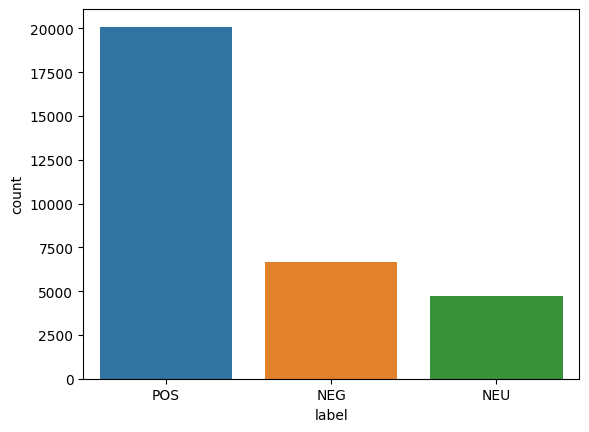

In [3]:
sns.countplot(x='label', data=data)

Text(0.5, 9.444444444444438, 'Token Count')

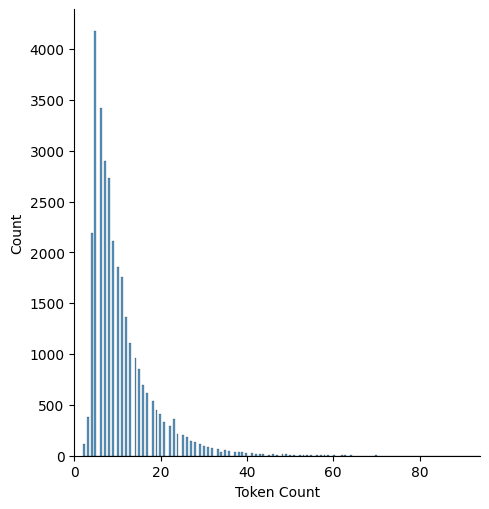

In [5]:
# Distribution of length of Sentence
tokenizer = PhobertTokenizer.from_pretrained("vinai/phobert-base-v2")
all_data = data.wseg.tolist() 
all_data = [' '.join(simple_preprocess(text)) for text in all_data]
encoded_text = [tokenizer.encode(text, add_special_tokens=True) for text in all_data]
token_lens = [len(text) for text in encoded_text]
sns.displot(token_lens)
plt.xlim([0,max(token_lens)])
plt.xlabel('Token Count')

In [7]:
def train(model, criterion, optimizer, train_loader):
    model.train()
    losses = []
    correct = 0

    for data in tqdm(train_loader):
        input_ids = data['input_ids'].to(device)
        attention_mask = data['attention_masks'].to(device)
        targets = data['targets'].to(device)

        optimizer.zero_grad()
        outputs = model(
            input_ids=input_ids,
            attention_mask=attention_mask
        )

        loss = criterion(outputs, targets)
        _, pred = torch.max(outputs, dim=1)

        correct += torch.sum(pred == targets)
        losses.append(loss.item())
        loss.backward()
        nn.utils.clip_grad_norm_(model.parameters(), max_norm=1.0)
        optimizer.step()
        lr_scheduler.step()

    print(f'Train Accuracy: {correct.double()/len(train_loader.dataset)} Loss: {np.mean(losses)}')

def eval(test_data = False):
    model.eval()
    losses = []
    correct = 0

    with torch.no_grad():
        data_loader = test_loader if test_data else valid_loader
        for data in data_loader:
            input_ids = data['input_ids'].to(device)
            attention_mask = data['attention_masks'].to(device)
            targets = data['targets'].to(device)

            outputs = model(
                input_ids=input_ids,
                attention_mask=attention_mask
            )

            _, pred = torch.max(outputs, dim=1)

            loss = criterion(outputs, targets)
            correct += torch.sum(pred == targets)
            losses.append(loss.item())
    
    if test_data:
        print(f'Test Accuracy: {correct.double()/len(test_loader.dataset)} Loss: {np.mean(losses)}')
        return correct.double()/len(test_loader.dataset)
    else:
        print(f'Valid Accuracy: {correct.double()/len(valid_loader.dataset)} Loss: {np.mean(losses)}')
        return correct.double()/len(valid_loader.dataset)

In [8]:
def prepare_loaders(df, fold):
    df_train = df[df.kfold != fold].reset_index(drop=True)
    df_valid = df[df.kfold == fold].reset_index(drop=True)
    
    train_dataset = SentimentDataset(df_train, tokenizer, max_len=120)
    valid_dataset = SentimentDataset(df_valid, tokenizer, max_len=120)
    
    train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers=2)
    valid_loader = DataLoader(valid_dataset, batch_size=64, shuffle=True, num_workers=2)
    
    return train_loader, valid_loader

    

In [9]:
for fold in range(skf.n_splits):
    print(f'-----------Fold: {fold+1} ------------------')
    train_loader, valid_loader = prepare_loaders(data, fold=fold)
    model = SentimentClassifier(n_classes=7).to(device)
    criterion = nn.CrossEntropyLoss()
    optimizer = AdamW(model.parameters(), lr=2e-5)
    
    lr_scheduler = get_linear_schedule_with_warmup(
                optimizer, 
                num_warmup_steps=0, 
                num_training_steps=len(train_loader)*EPOCHS
            )
    best_acc = 0
    for epoch in range(EPOCHS):
        print(f'Epoch {epoch+1}/{EPOCHS}')
        print('-'*30)

        train(model, criterion, optimizer, train_loader)
        val_acc = eval()

        if val_acc > best_acc:
            torch.save(model.state_dict(), f'phobert_fold{fold+1}.pth')
            best_acc = val_acc

-----------Fold: 1 ------------------


Epoch 1/6
------------------------------


100%|██████████| 394/394 [07:06<00:00,  1.08s/it]

Train Accuracy: 0.7070883661792753 Loss: 0.8145919395279764


Valid Accuracy: 0.7997457088366179 Loss: 0.523646023237344
Epoch 2/6
------------------------------


100%|██████████| 394/394 [07:08<00:00,  1.09s/it]

Train Accuracy: 0.8006198347107438 Loss: 0.5030509453588331


Valid Accuracy: 0.7925937698664971 Loss: 0.5032677566162264
Epoch 3/6
------------------------------


100%|██████████| 394/394 [07:08<00:00,  1.09s/it]

Train Accuracy: 0.8201287349014622 Loss: 0.4582012914083331


Valid Accuracy: 0.8040368722186904 Loss: 0.49464204847210586
Epoch 4/6
------------------------------


100%|██████████| 394/394 [07:10<00:00,  1.09s/it]

Train Accuracy: 0.8333598219961856 Loss: 0.42589451520122246


Valid Accuracy: 0.8005403687221869 Loss: 0.5238254795772861
Epoch 5/6
------------------------------


100%|██████████| 394/394 [07:10<00:00,  1.09s/it]

Train Accuracy: 0.8442863954227591 Loss: 0.39992350570592783


Valid Accuracy: 0.8003814367450731 Loss: 0.5261131428708934
Epoch 6/6
------------------------------


100%|██████████| 394/394 [07:10<00:00,  1.09s/it]

Train Accuracy: 0.8546964399237127 Loss: 0.3777119976841859


Valid Accuracy: 0.801176096630642 Loss: 0.5381238586974867
-----------Fold: 2 ------------------
Epoch 1/6
------------------------------


100%|██████████| 394/394 [07:10<00:00,  1.09s/it]

Train Accuracy: 0.751152256834075 Loss: 0.7020575519897005


Valid Accuracy: 0.8038779402415767 Loss: 0.4871502441890312
Epoch 2/6
------------------------------


 63%|██████▎   | 248/394 [04:31<02:39,  1.09s/it]

In [18]:
from datasets import Dataset
data = pd.read_csv('data - data.csv', usecols=range(0, 3))
data['wseg'] = data['comment'].apply(lambda x : " ".join(rdrsegmenter.word_segment(x)))

def preprocess_function(examples):
    return tokenizer(examples["wseg"], truncation=True)

from transformers import AutoModelForSequenceClassification, TrainingArguments, Trainer
phobert = AutoModel.from_pretrained("vinai/phobert-base-v2")
tokenizer = PhobertTokenizer.from_pretrained("vinai/phobert-base-v2")
model = AutoModelForSequenceClassification.from_pretrained(
    "vinai/phobert-base-v2", num_labels=3, id2label=id2label, label2id=label2id
)

train_encodings = tokenizer(data['wseg'].tolist(), truncation=True, padding=True)
train_labels = data['label'].tolist() 
data_dict = dict(train_encodings)
data_dict['label'] = train_labels
train_dataset = Dataset.from_dict(data)
dataset = train_dataset.map(preprocess_function, batched=True)

<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class '

Map:   6%|▋         | 2000/31460 [00:00<00:01, 15220.33 examples/s]

<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>


In [19]:
import numpy as np
from transformers import AutoTokenizer, AutoModelForSequenceClassification, TrainingArguments, Trainer, DataCollatorWithPadding
import evaluate

accuracy = evaluate.load("accuracy")

def compute_metrics(eval_pred):
    predictions, labels = eval_pred
    predictions = np.argmax(predictions, axis=1)
    return accuracy.compute(predictions=predictions, references=labels)
# from datasets import Dataset
# dataset = Dataset.from_dict(data)



training_args = TrainingArguments(
    output_dir="my_awesome_model",
    learning_rate=2e-5,
    per_device_train_batch_size=16,
    per_device_eval_batch_size=16,
    num_train_epochs=2,
    weight_decay=0.01,
    evaluation_strategy="epoch",
    save_strategy="epoch",
    load_best_model_at_end=True,
    push_to_hub=True,
)

data_collator = DataCollatorWithPadding(tokenizer=tokenizer)
trainer = Trainer(
    model=model,
    args=training_args,
    train_dataset=dataset,
    eval_dataset=dataset,
    tokenizer=tokenizer,
    data_collator=data_collator,
    compute_metrics=compute_metrics,
)

trainer.train()

/home/ubuntu/anhdao/TextMining_Classification/my_awesome_model is already a clone of https://huggingface.co/Lukedinh/my_awesome_model. Make sure you pull the latest changes with `repo.git_pull()`.


<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>


ValueError: Unable to create tensor, you should probably activate truncation and/or padding with 'padding=True' 'truncation=True' to have batched tensors with the same length. Perhaps your features (`label` in this case) have excessive nesting (inputs type `list` where type `int` is expected).

<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>
<class 'bytes'>


{'comment': 'Áo bao đẹp ạ!!',
 'label': 'POS',
 'rate': 5,
 'wseg': 'Áo bao đẹp ạ ! !'}